In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import atlite
import numpy as np
import logging 
logging.basicConfig(level=logging.INFO)
import xesmf as xe

/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/esmpy/interface/loadESMF.py:94: VersionWarning: ESMF installation version 8.8.0, ESMPy version 8.8.0b0
  warnings.warn("ESMF installation version {}, ESMPy version {}".format(


In [2]:
influx_dir=xr.open_dataset("/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation-backup/bias_factors/influx_direct_bias_factor_Era5.nc")
influx_diff=xr.open_dataset("/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation-backup/bias_factors/influx_diffuse_bias_factor_Era5.nc")
from plots import map_plots

influx_dir

<xarray.Dataset> Size: 69kB
Dimensions:      (lat: 107, lon: 157)
Coordinates:
  * lat          (lat) float64 856B 33.0 33.3 33.6 33.9 ... 63.9 64.2 64.5 64.8
  * lon          (lon) float64 1kB -12.0 -11.7 -11.4 -11.1 ... 34.4 34.7 35.0
Data variables:
    bias_factor  (lat, lon) float32 67kB ...

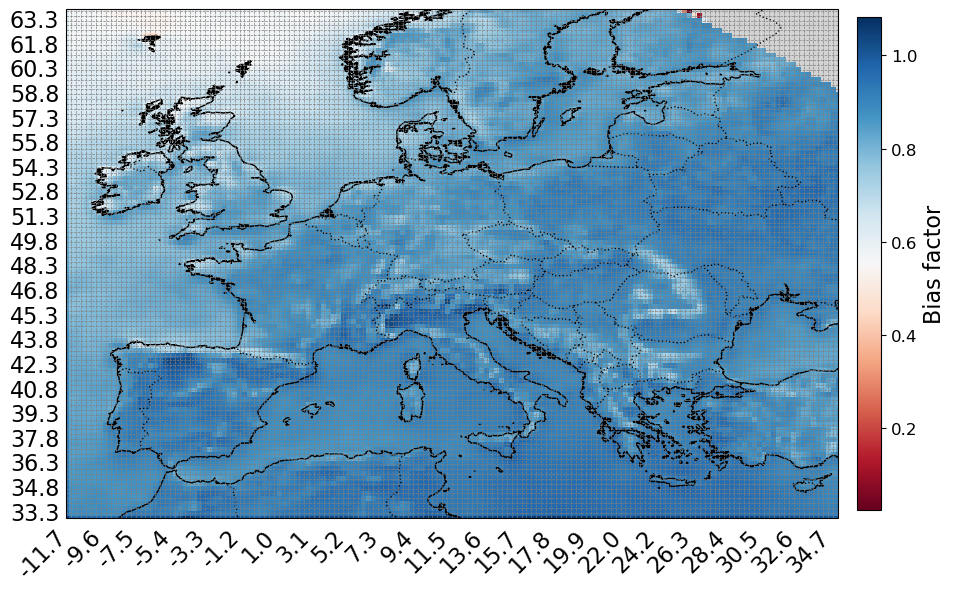

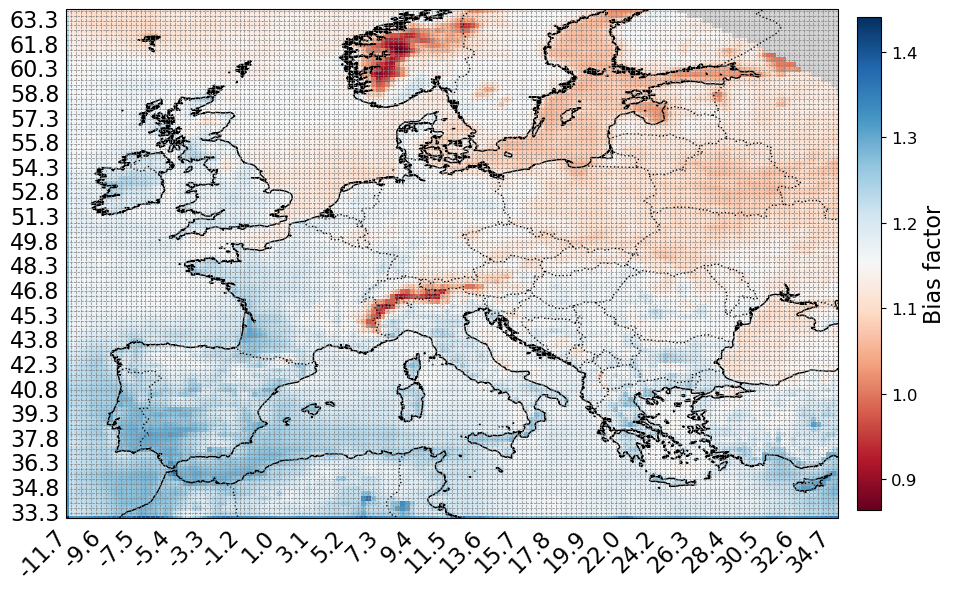

In [73]:
from plots import map_plots_lon
bias_direct=influx_dir['bias_factor']
bias_diffuse=influx_diff['bias_factor']
vmin=min(bias_direct.min(), bias_diffuse.min())
vmax=max(bias_direct.max(), bias_diffuse.max())
map_plots_lon(bias_direct,
              cmap='RdBu', setnan=True, vmin=None,vmax=None, title=None, label='Bias factor')
map_plots_lon(bias_diffuse,
              cmap='RdBu', setnan=True, vmin=None,vmax=None, title=None, label='Bias factor')

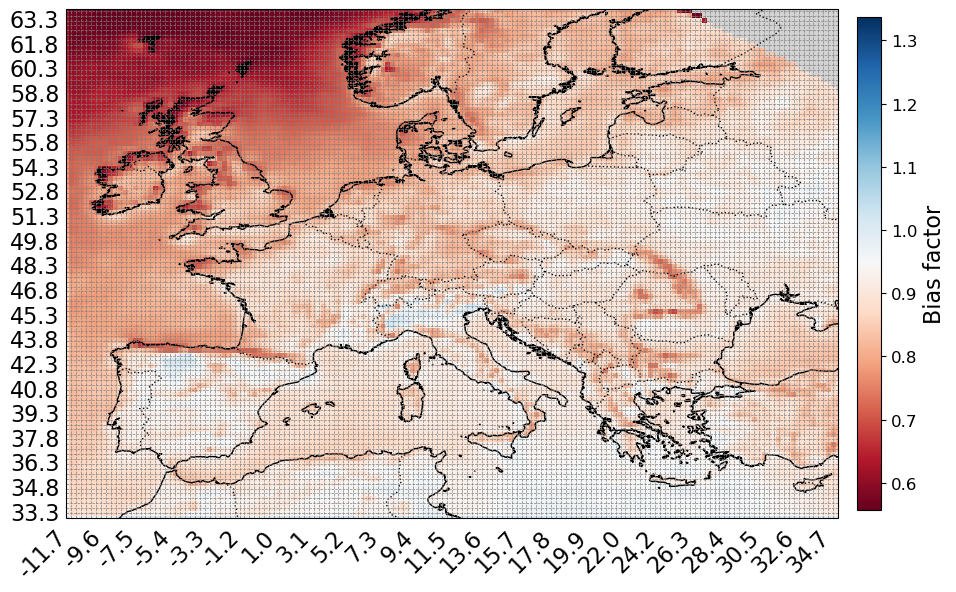

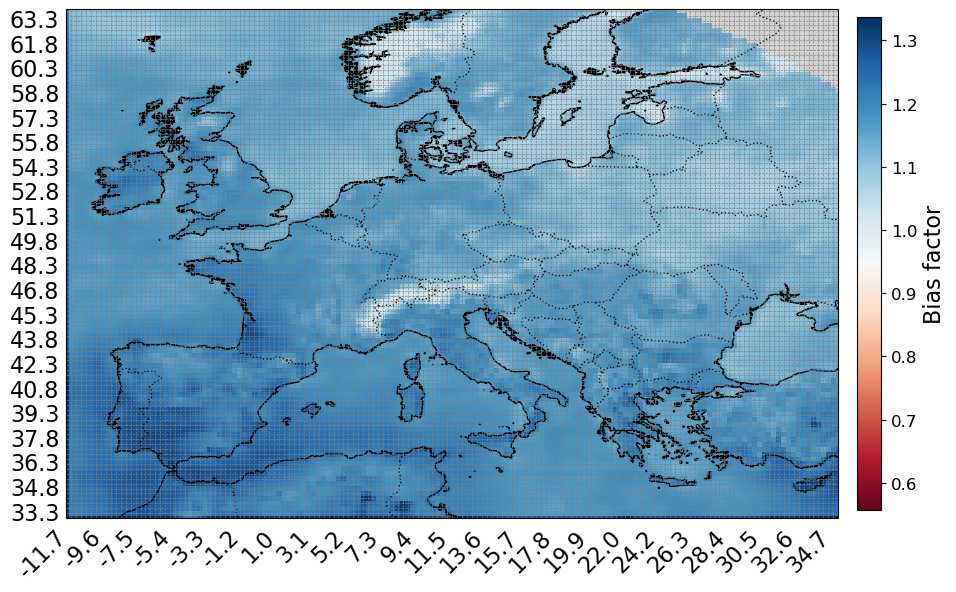

In [19]:
import numpy as np
from plots import map_plots_lon

# Calculate quantiles for clipping
q_min = 1
q_max = 99

bias_direct = influx_dir['bias_factor']
bias_diffuse = influx_diff['bias_factor']

# Clip values to the 0.5-99.5 quantiles using np.nanpercentile
bias_direct_clipped = np.clip(bias_direct, np.nanpercentile(bias_direct, q_min), np.nanpercentile(bias_direct, q_max))
bias_diffuse_clipped = np.clip(bias_diffuse, np.nanpercentile(bias_diffuse, q_min), np.nanpercentile(bias_diffuse, q_max))

# Determine vmin and vmax based on clipped values
vmin = min(np.nanmin(bias_direct_clipped), np.nanmin(bias_diffuse_clipped))
vmax = max(np.nanmax(bias_direct_clipped), np.nanmax(bias_diffuse_clipped))

# Plot the clipped data
map_plots_lon(bias_direct_clipped,
              cmap='RdBu', setnan=False, vmin=vmin, vmax=vmax, title=None, label='Bias factor')
map_plots_lon(bias_diffuse_clipped,
              cmap='RdBu', setnan=False, vmin=vmin, vmax=vmax, title=None, label='Bias factor')

In [26]:
import matplotlib.ticker as mticker
def map_plots_lon(variable,
                  cmap='viridis',
                  setnan=True,
                  vmin=None,
                  vmax=None,
                  title=None,
                  label=''):
    """
    Plot a 2D DataArray (lat,lon) on a PlateCarree map, masking zeros if requested.
    If title is falsy, no title is drawn and the axes are expanded
    symmetrically so the colorbar sits neatly inside.
    """
    # mask zeros→NaN and subset
    if setnan:
        variable = xr.where(variable != 0, variable, np.nan)
    variable = variable.sel(lon=slice(-12, 35), lat=slice(33, 64))

    lon = variable['lon']
    lat = variable['lat']

    fig, ax = plt.subplots(
        figsize=(12, 8),
        subplot_kw={'projection': ccrs.PlateCarree()}
    )
    ax.set_extent([-12, 35, 33, 64], crs=ccrs.PlateCarree())

    mesh = ax.pcolormesh(
        lon, lat, variable,
        transform=ccrs.PlateCarree(),
        cmap=cmap, shading='auto',
        vmin=vmin, vmax=vmax
    )

    # map features
    ax.coastlines(resolution='10m', linewidth=1)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='white')

    # conditional title
    if title:
        ax.set_title(title, fontsize=16)

    # gridlines
    gl = ax.gridlines(
        draw_labels=True, linewidth=0.5,
        color='gray', linestyle='--',
        x_inline=False, y_inline=False
    )
    gl.xlocator = mticker.FixedLocator(lon.values)
    gl.ylocator = mticker.FixedLocator(lat.values)
    gl.xformatter = mticker.FuncFormatter(lambda x, _: f"{x:.1f}")
    gl.yformatter = mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'fontsize': 16, 'rotation': 45, 'ha': 'right'}
    gl.ylabel_style = {'fontsize': 16}
    gl.xlines = False
    gl.ylines = False

    # colorbar
    cbar = fig.colorbar(mesh, ax=ax,
                        orientation='vertical',
                        pad=0.02,
                        shrink=0.8)
    cbar.set_label(label, fontsize=16)
    cbar.ax.tick_params(labelsize=12)

    # symmetric lift if no title
    if not title:
        left, bottom, width, height = ax.get_position().bounds
        δ = 0.05
        new_bottom = max(0, bottom - δ/2)
        ax.set_position([left, new_bottom, width, height + δ])

    plt.show()

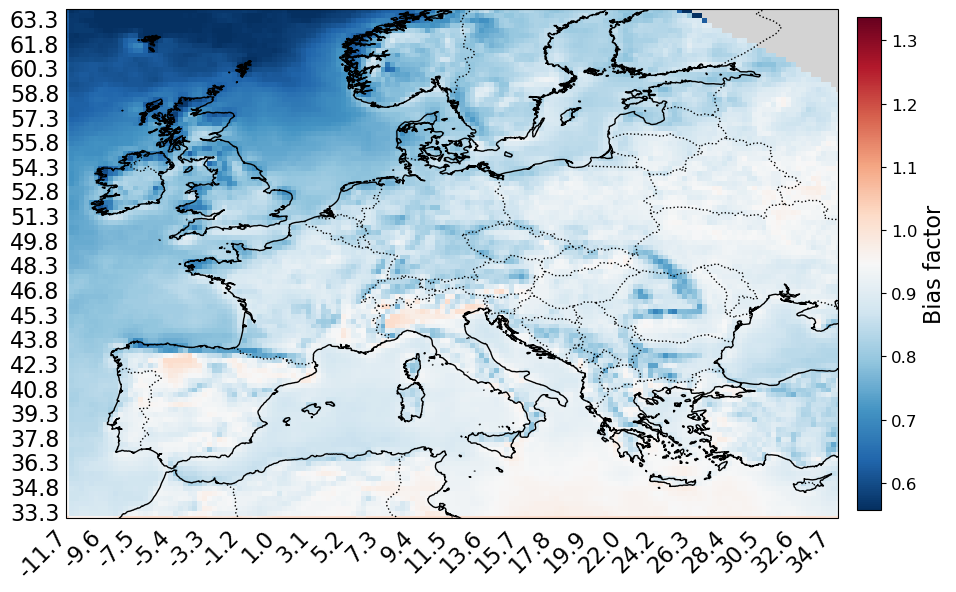

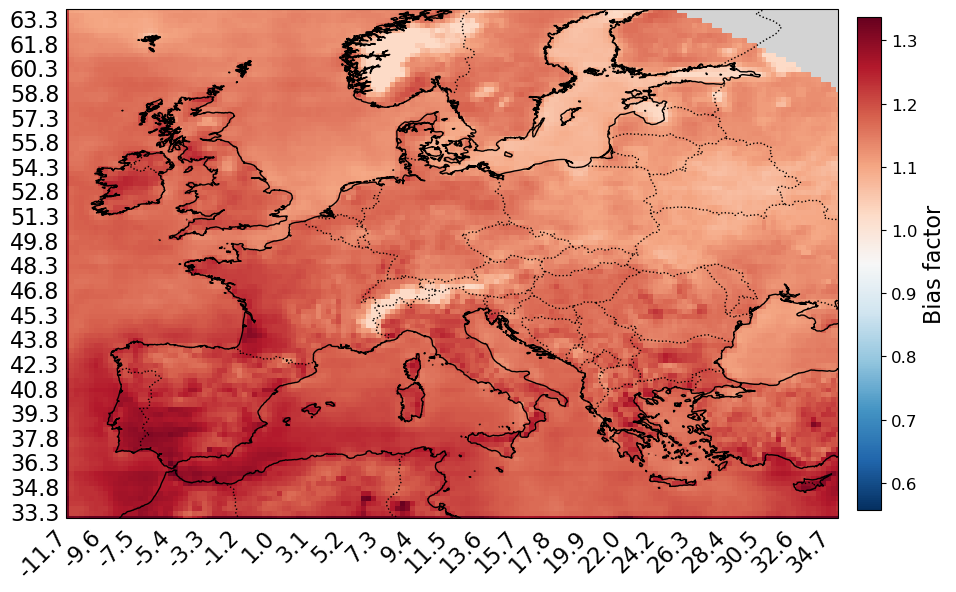

In [28]:
# Clip values to the 0.5-99.5 quantiles using np.nanpercentile
bias_direct_clipped = np.clip(bias_direct, np.nanpercentile(bias_direct, q_min), np.nanpercentile(bias_direct, q_max))
bias_diffuse_clipped = np.clip(bias_diffuse, np.nanpercentile(bias_diffuse, q_min), np.nanpercentile(bias_diffuse, q_max))

# Determine vmin and vmax based on clipped values
vmin = min(np.nanmin(bias_direct_clipped), np.nanmin(bias_diffuse_clipped))
vmax = max(np.nanmax(bias_direct_clipped), np.nanmax(bias_diffuse_clipped))

# Plot the clipped data
map_plots_lon(bias_direct_clipped,
              cmap='RdBu_r', setnan=False, vmin=vmin, vmax=vmax, title=None, label='Bias factor')
map_plots_lon(bias_diffuse_clipped,
              cmap='RdBu_r', setnan=False, vmin=vmin, vmax=vmax, title=None, label='Bias factor')

In [98]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm
import numpy as np

def map_plots_lon_pair(var1, var2,
                       titles=('Plot 1','Plot 2'),
                       cmap='RdBu_r',
                       setnan=True,
                       vmin=None,
                       vmax=None,
                       label='Bias factor'):
    """
    Plot two 2D DataArrays side by side with a single vertical colorbar
    whose height matches exactly the map panels.
    """
    # Mask zeros → NaN and subset region
    if setnan:
        var1 = var1.where(var1 != 0)
        var2 = var2.where(var2 != 0)
    var1 = var1.sel(lon=slice(-12, 35), lat=slice(33, 64))
    var2 = var2.sel(lon=slice(-12, 35), lat=slice(33, 64))

    lon = var1.lon.values
    lat = var1.lat.values
    d1  = var1.values
    d2  = var2.values

    # Compute shared vmin/vmax if not provided
    if vmin is None or vmax is None:
        allvals = np.concatenate([d1.ravel(), d2.ravel()])
        vmin = np.nanmin(allvals) if vmin is None else vmin
        vmax = np.nanmax(allvals) if vmax is None else vmax

    norm = TwoSlopeNorm(vmin=vmin, vcenter=1.0, vmax=vmax)

    # Create two map panels
    fig, axes = plt.subplots(1, 2, figsize=(16, 10),
                             subplot_kw={'projection': ccrs.PlateCarree()},
                             sharex=True, sharey=True)
    fig.subplots_adjust(wspace=0.02)

    for ax, data, title in zip(axes, (d1, d2), titles):
        mesh = ax.pcolormesh(lon, lat, data,
                             transform=ccrs.PlateCarree(),
                             cmap=cmap, norm=norm, shading='auto')
        ax.set_extent([-12, 35, 33, 64], ccrs.PlateCarree())
        ax.coastlines('10m', linewidth=1)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, facecolor='lightgray')
        ax.add_feature(cfeature.OCEAN, facecolor='white')
        ax.set_title(title, fontsize=18)
        ax.set_xlabel('Longitude', fontsize=18)
        ax.set_ylabel('Latitude', fontsize=18)

    # Use the first axes bbox to place a colorbar of matching height
    pos = axes[1].get_position()  # Bbox where [x0, y0, width, height]
    cax = fig.add_axes([
        pos.x1 + 0.01,  # a bit to the right of the first map
        pos.y0,        # same bottom
        0.015,          # bar width
        pos.height     # same height
    ])
    cbar = fig.colorbar(mesh, cax=cax, orientation='vertical', extend='both')
    cbar.set_label(label, fontsize=18)
    cbar.ax.tick_params(labelsize=10)

    plt.savefig("/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation-backup/figures/sarah-era5-bias.pdf", bbox_inches='tight', dpi=300)
    plt.show()

    



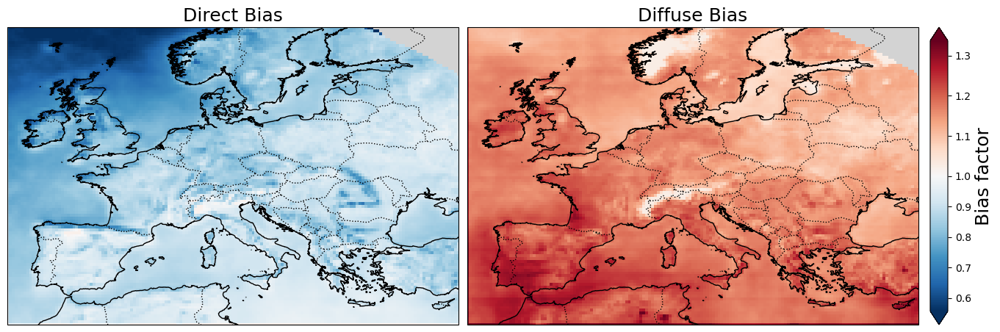

In [99]:
q_min = 1
q_max = 99

bias_direct = influx_dir['bias_factor']
bias_diffuse = influx_diff['bias_factor']

# Clip values to the 0.5-99.5 quantiles using np.nanpercentile
bias_direct_clipped = np.clip(bias_direct, np.nanpercentile(bias_direct, q_min), np.nanpercentile(bias_direct, q_max))
bias_diffuse_clipped = np.clip(bias_diffuse, np.nanpercentile(bias_diffuse, q_min), np.nanpercentile(bias_diffuse, q_max))

# Determine vmin and vmax based on clipped values
vmin = min(np.nanmin(bias_direct_clipped), np.nanmin(bias_diffuse_clipped))
vmax = max(np.nanmax(bias_direct_clipped), np.nanmax(bias_diffuse_clipped))
map_plots_lon_pair(bias_direct_clipped, bias_diffuse_clipped,
                   titles=('Direct Bias', 'Diffuse Bias'),
                   cmap='RdBu_r', setnan=False, vmin=vmin, vmax=vmax, label='Bias factor')


/tmp/ipykernel_15428/3778259661.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


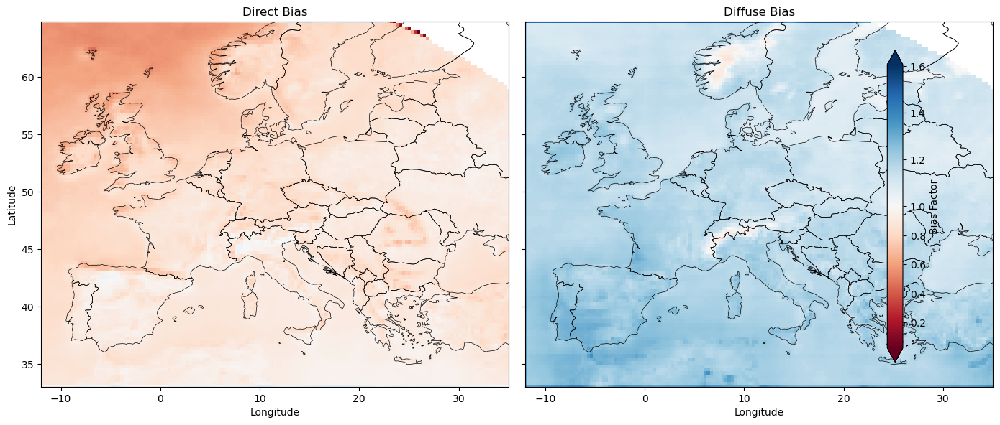

In [25]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# --- ensure 'europe' is defined as above, and bias_direct / bias_diffuse exist ---
# 1) If you don’t already have it, load Natural Earth admin_0_countries (50m)
import geopandas as gpd
url = "https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_countries.zip"
world = gpd.read_file(url)
extras = ['TUR','XKX']
europe = world[
    (world['CONTINENT']=='Europe') |
    (world['ADM0_A3'].isin(extras))
].to_crs("EPSG:4326")

# 2) Extract lon/lat and data
lons = bias_direct.lon.values
lats = bias_direct.lat.values
d0   = bias_direct.values
d1   = bias_diffuse.values
# Extract grid and data
lons = bias_direct.lon.values
lats = bias_direct.lat.values
d0   = bias_direct.values
d1   = bias_diffuse.values

x0, x1 = lons.min(), lons.max()
y0, y1 = lats.min(), lats.max()


# Symmetrize the norm about 1.0
vmin = min(bias_diffuse.min(), bias_direct.min())
vmax = max(bias_direct.max(), bias_diffuse.max())
norm = TwoSlopeNorm(vmin=vmin, vcenter=1.0, vmax=vmax)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)
for ax, data, title in zip(axes, (d0, d1), ("Direct Bias", "Diffuse Bias")):
    pcm = ax.pcolormesh(lons, lats, data,
                        cmap='RdBu', norm=norm, shading='auto')
    europe.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5)
    ax.set_title(title)
    ax.set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")

for ax in axes:
    ax.set_xlim(x0, x1)
    ax.set_ylim(y0, y1)

# Single vertical colorbar on the right
cbar = fig.colorbar(pcm,
                    ax=axes.ravel().tolist(),
                    orientation='vertical',
                    fraction=0.02,
                    pad=0.02,
                    extend='both')
cbar.set_label("Bias Factor")

plt.tight_layout()
plt.show()


In [2]:
from regridding_functions import read_and_average_era5_4y
from regridding_functions import read_and_average_sarah
rsds_era5_mean= read_and_average_era5_4y('influx_direct')
rsds_sarah_mean= read_and_average_sarah('influx_direct')

['/groups/EXTREMES/cutouts/europe-1996-era5.nc', '/groups/EXTREMES/cutouts/europe-2010-era5.nc', '/groups/EXTREMES/cutouts/europe-2012-era5.nc', '/groups/EXTREMES/cutouts/europe-2010-era5.nc']
['/groups/EXTREMES/SARAH-3/europe-1996-sarah3-era5.nc', '/groups/EXTREMES/SARAH-3/europe-2010-sarah3-era5.nc', '/groups/EXTREMES/SARAH-3/europe-2012-sarah3-era5.nc', '/groups/EXTREMES/SARAH-3/europe-2010-sarah3-era5.nc']


In [3]:
rsds_era5_mean

<xarray.DataArray 'influx_direct' (y: 157, x: 189)> Size: 119kB
dask.array<mean_agg-aggregate, shape=(157, 189), dtype=float32, chunksize=(157, 189), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 2kB -12.0 -11.75 -11.5 -11.25 ... 34.25 34.5 34.75 35.0
  * y        (y) float64 1kB 33.0 33.25 33.5 33.75 ... 71.25 71.5 71.75 72.0
    lon      (x) float64 2kB dask.array<chunksize=(189,), meta=np.ndarray>
    lat      (y) float64 1kB dask.array<chunksize=(157,), meta=np.ndarray>

In [5]:
rsds_sarah_mean

<xarray.DataArray 'influx_direct' (y: 131, x: 177)> Size: 93kB
dask.array<mean_agg-aggregate, shape=(131, 177), dtype=float32, chunksize=(33, 45), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 1kB -12.0 -11.7 -11.4 -11.1 ... 39.9 40.2 40.5 40.8
  * y        (y) float64 1kB 33.0 33.3 33.6 33.9 34.2 ... 71.1 71.4 71.7 72.0
    lon      (x) float64 1kB dask.array<chunksize=(177,), meta=np.ndarray>
    lat      (y) float64 1kB dask.array<chunksize=(131,), meta=np.ndarray>

In [6]:
rsds_era5_mean_cut=rsds_era5_mean.sel(x=slice(-12, 35), y=slice(33, 64.8))
rsds_sarah_mean_cut=rsds_sarah_mean.sel(x=slice(-12, 35), y=slice(33, 64.8))

In [7]:
from regridding_functions import regrid
regridder=regrid(rsds_era5_mean_cut, rsds_sarah_mean_cut, method='conservative')

189 190
128 129
157 158
107 108


In [8]:
regridder

xESMF Regridder 
Regridding algorithm:       conservative 
Weight filename:            conservative_128x189_107x157.nc 
Reuse pre-computed weights? False 
Input grid shape:           (128, 189) 
Output grid shape:          (107, 157) 
Periodic in longitude?      False

In [9]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
rsds_era5_mean_interp_cut=regridder(rsds_era5_mean_cut)


rsds_era5_mean_interp_cut



/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('y', 'x') from data variable influx_direct as the horizontal dimensions for the regridding.
  warnings.warn(


<xarray.DataArray (lat: 107, lon: 157)> Size: 67kB
dask.array<astype, shape=(107, 157), dtype=float32, chunksize=(107, 157), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 856B 33.0 33.3 33.6 33.9 34.2 ... 63.9 64.2 64.5 64.8
  * lon      (lon) float64 1kB -12.0 -11.7 -11.4 -11.1 ... 33.9 34.2 34.5 34.8
Attributes:
    regrid_method:  conservative

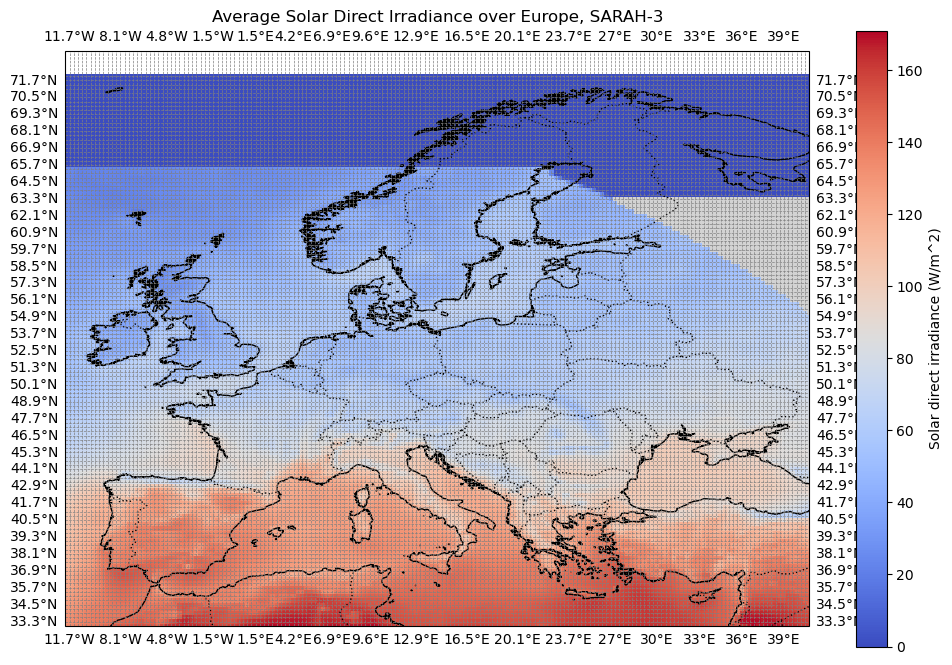

In [10]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Extract the longitude and latitude from the dataset
lon = rsds_sarah_mean.lon
lat = rsds_sarah_mean.lat

# Create the figure and axes with a PlateCarree projection
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the solar irradiance at the selected time
rsds_sarah_mean.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for solar irradiance
    cbar_kwargs={'label': 'Solar direct irradiance (W/m^2)'}
)

# Add map features for context
ax.coastlines(resolution='10m', linewidth=1)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='white')

# Set extent to Europe using the min and max of the lon and lat from the data
ax.set_extent([lon.min(), lon.max(), lat.min(), lat.max()])

# Add gridlines for each latitude and longitude
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon, ylocs=lat, x_inline=False, y_inline=False)

# Add title and labels
plt.title(f'Average Solar Direct Irradiance over Europe, SARAH-3')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()



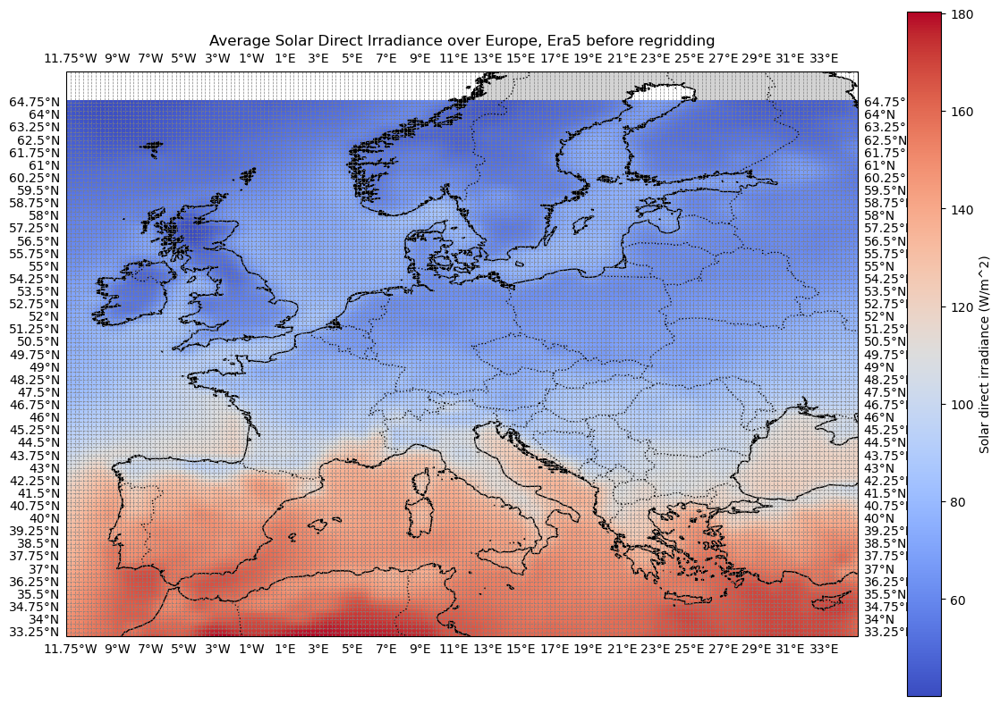

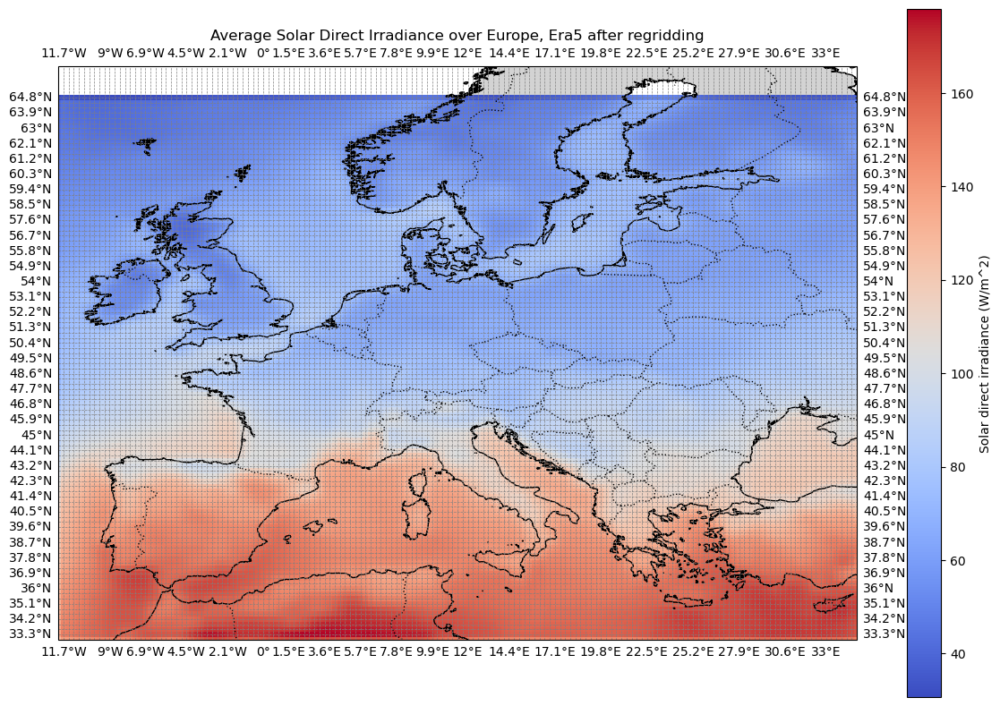

In [11]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Extract the longitude and latitude from the datasets
lon_era5 = rsds_era5_mean_cut.lon
lat_era5 = rsds_era5_mean_cut.lat
lon_era5_interp_cut = rsds_era5_mean_interp_cut.lon
lat_era5_interp_cut = rsds_era5_mean_interp_cut.lat

# Create the figure for rsds_era5_mean (before regridding)
fig1, ax1 = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax1.set_title('rsds_era5_mean (Before Regridding)')
rsds_era5_mean_cut.plot(
    ax=ax1,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for solar irradiance
    cbar_kwargs={'label': 'Solar direct irradiance (W/m^2)'}
)

# Add map features for context
ax1.coastlines(resolution='10m', linewidth=1)
ax1.add_feature(cfeature.BORDERS, linestyle=':')
ax1.add_feature(cfeature.LAND, facecolor='lightgray')
ax1.add_feature(cfeature.OCEAN, facecolor='white')

# Add gridlines for exact latitude and longitude points (before regridding)
ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon_era5, ylocs=lat_era5, x_inline=False, y_inline=False)

# Set the extent to Europe for the first plot
ax1.set_extent([lon_era5.min(), lon_era5.max(), lat_era5.min(), lat_era5.max()])

# Show the first plot
plt.title(f'Average Solar Direct Irradiance over Europe, Era5 before regridding')
plt.tight_layout()
plt.show()

# Create the figure for rsds_era5_mean_interp (after regridding)
fig2, ax2 = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax2.set_title('rsds_era5_mean_interp (After Regridding)')
rsds_era5_mean_interp_cut.plot(
    ax=ax2,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for solar irradiance
    cbar_kwargs={'label': 'Solar direct irradiance (W/m^2)'}
)

# Add map features for context
ax2.coastlines(resolution='10m', linewidth=1)
ax2.add_feature(cfeature.BORDERS, linestyle=':')
ax2.add_feature(cfeature.LAND, facecolor='lightgray')
ax2.add_feature(cfeature.OCEAN, facecolor='white')

# Add gridlines for exact latitude and longitude points (after regridding)
ax2.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon_era5_interp_cut, ylocs=lat_era5_interp_cut, x_inline=False, y_inline=False)

# Set the extent to Europe for the second plot
ax2.set_extent([lon_era5_interp_cut.min(), lon_era5_interp_cut.max(), lat_era5_interp_cut.min(), lat_era5_interp_cut.max()]) #I choose the smaller coordinate range from Era5

# Show the second plot
plt.title(f'Average Solar Direct Irradiance over Europe, Era5 after regridding')
plt.tight_layout()
plt.show()


In [12]:
# Check the latitude and longitude range and increments for each dataset
def check_lat_lon_range_and_increment(ds, dataset_name):
    # Extract the latitude and longitude
    lat = ds.lat
    lon = ds.lon
    
    # Latitude and longitude range
    lat_range = (lat.min().values, lat.max().values)
    lon_range = (lon.min().values, lon.max().values)
    
    # Latitude and longitude increment (difference between consecutive values)
    lat_increment = np.abs(lat[1] - lat[0]).values
    lon_increment = np.abs(lon[1] - lon[0]).values
    
    print(f"Dataset: {dataset_name}")
    print(f"Latitude range: {lat_range}")
    print(f"Longitude range: {lon_range}")
    print(f"Latitude increment: {lat_increment} degrees")
    print(f"Longitude increment: {lon_increment} degrees")
    print("-" * 50)

# Check for rsds_era5_mean
check_lat_lon_range_and_increment(rsds_era5_mean, "rsds_era5_mean")

# Check for rsds_era5_mean_interp
check_lat_lon_range_and_increment(rsds_era5_mean_interp_cut, "rsds_era5_mean_interp")

# Check for rsds_sarah_mean
check_lat_lon_range_and_increment(rsds_sarah_mean_cut, "rsds_sarah_mean_cut")


Dataset: rsds_era5_mean
Latitude range: (array(33.), array(72.))
Longitude range: (array(-12.), array(35.))
Latitude increment: 0.25 degrees
Longitude increment: 0.25 degrees
--------------------------------------------------
Dataset: rsds_era5_mean_interp
Latitude range: (array(33.), array(64.8))
Longitude range: (array(-12.), array(34.8))
Latitude increment: 0.29999999999999716 degrees
Longitude increment: 0.3000000000000007 degrees
--------------------------------------------------
Dataset: rsds_sarah_mean_cut
Latitude range: (array(33.), array(64.8))
Longitude range: (array(-12.), array(34.8))
Latitude increment: 0.29999999999999716 degrees
Longitude increment: 0.3000000000000007 degrees
--------------------------------------------------


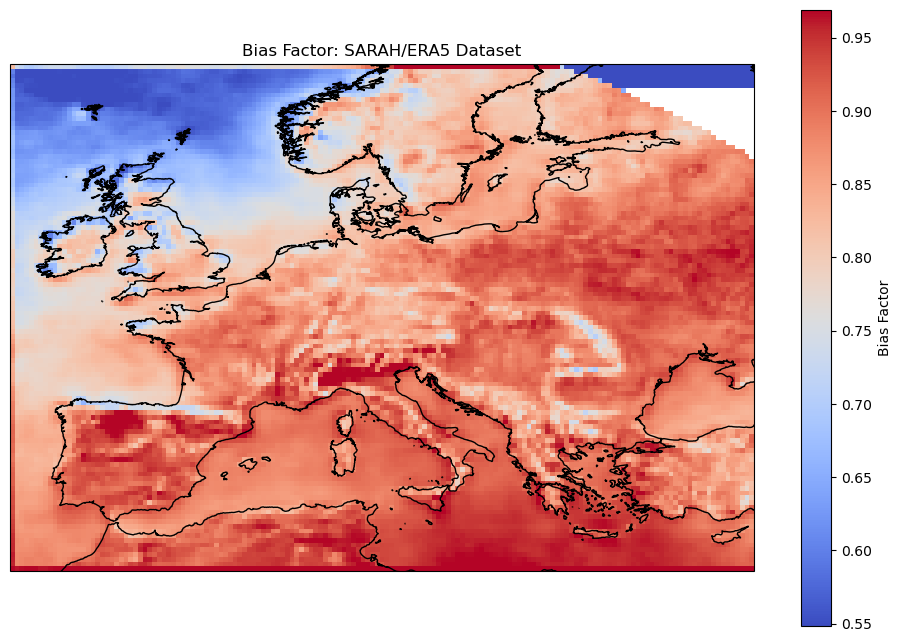

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Assuming these variables exist
denominator= rsds_era5_mean_interp_cut.values  # ERA5 dataset
numerator= rsds_sarah_mean_cut.values  # SARAH dataset

# Ensure valid bias factor calculation
mask_valid = (denominator != 0)  # Avoid division by zero and all values in sarah that have mean 0
biased_values = np.where(mask_valid, numerator / denominator, np.nan)  # Replace invalid cases with NaN

# Ensure correct shape
biased_values = np.squeeze(biased_values)

# Get lat/lon values
lon = rsds_sarah_mean_cut.lon.values
lat = rsds_sarah_mean_cut.lat.values

# Ensure lon/lat are 2D using meshgrid
lon2d, lat2d = np.meshgrid(lon, lat)

# Use percentiles to remove outliers
vmin = np.nanpercentile(biased_values, 2)  # 2nd percentile (lower bound)
vmax = np.nanpercentile(biased_values, 98)  # 98th percentile (upper bound)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the bias factor (masked)
c = ax.pcolormesh(
    lon2d, lat2d, biased_values,  # Ensure correct shapes
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for bias factor
    shading='auto',
    vmin=vmin, vmax=vmax  # Clip extreme outliers
)
# Set the latitude and longitude limits (set max latitude to 65)
#ax.set_extent([lon.min(), lon.max(), lat.min(), 65], crs=ccrs.PlateCarree())

# Add map features
ax.coastlines(resolution='10m', linewidth=1)
ax.set_title("Bias Factor: SARAH/ERA5 Dataset")

# Add colorbar
cbar = fig.colorbar(c, ax=ax, orientation='vertical', label='Bias Factor')

plt.show()



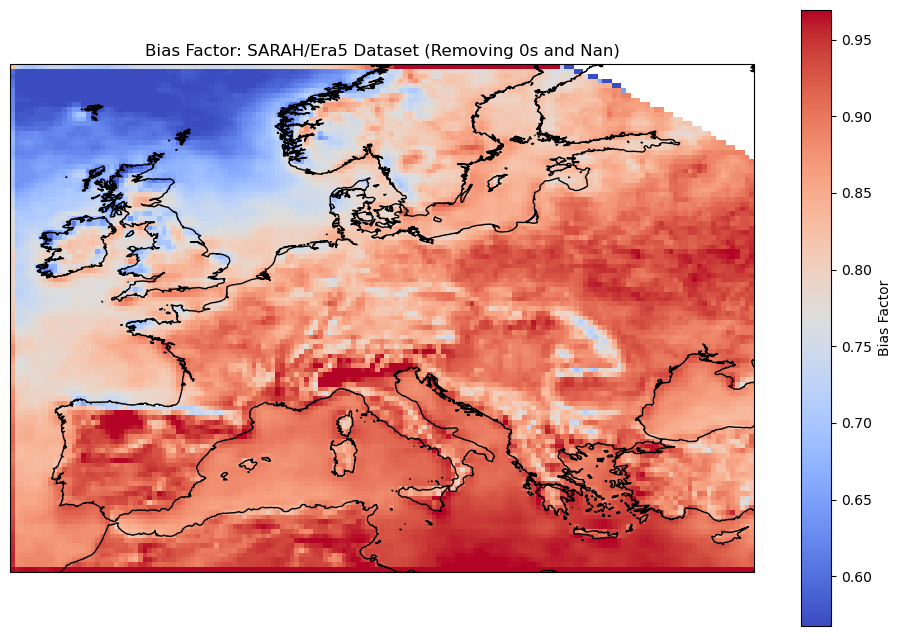

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Assuming these variables exist
denominator = rsds_era5_mean_interp_cut.values  # ERA5 dataset
numerator = rsds_sarah_mean_cut.values  # SARAH dataset

# Ensure valid bias factor calculation
mask_valid = (denominator != 0) & (numerator != 0)  # Avoid division by zero and all values in SARAH that have mean 0
biased_values = np.where(mask_valid, numerator / denominator, np.nan)  # Replace invalid cases with NaN

# Ensure correct shape (remove extra dimension if it exists)
biased_values = np.squeeze(biased_values)  # Remove extra dimensions (e.g., (2, 131, 177) to (131, 177))

# Check if the biased_values shape matches lon2d, lat2d
# Get lat/lon values
lon = rsds_era5_mean_interp_cut.lon.values #I choose the smaller coordinate range from Era5
lat = rsds_era5_mean_interp_cut.lat.values

# Ensure lon/lat are 2D using meshgrid
lon2d, lat2d = np.meshgrid(lon, lat)

# Use percentiles to remove outliers
vmin = np.nanpercentile(biased_values, 2)  # 2nd percentile (lower bound)
vmax = np.nanpercentile(biased_values, 98)  # 98th percentile (upper bound)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the bias factor (masked)
c = ax.pcolormesh(
    lon2d, lat2d, biased_values,  # Ensure correct shapes
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for bias factor
    shading='auto',
    vmin=vmin, vmax=vmax  # Clip extreme outliers
)

# Add map features
ax.coastlines(resolution='10m', linewidth=1)
ax.set_title("Bias Factor: SARAH/Era5 Dataset (Removing 0s and Nan)")

# Add colorbar
cbar = fig.colorbar(c, ax=ax, orientation='vertical', label='Bias Factor')

plt.show()


In [15]:
mean_bias_factor_era5_sarah = np.nanmean(biased_values)
print(f"Mean Bias Factor: {mean_bias_factor_era5_sarah:.3f}")

Mean Bias Factor: 0.843


In [16]:
# Calculate the 2nd and 98th percentiles to exclude outliers
lower_percentile = np.nanpercentile(biased_values, 2)  # 2nd percentile
upper_percentile = np.nanpercentile(biased_values, 98)  # 98th percentile

# Print the percentiles to check their range
print(f"2nd Percentile: {lower_percentile}")
print(f"98th Percentile: {upper_percentile}")

# Mask the biased_values to keep only those within the 2nd and 98th percentiles
filtered_biased_values = biased_values[(biased_values >= lower_percentile) & (biased_values <= upper_percentile)]

# Calculate the mean of the filtered values
mean_bias_factor_era5_sarah = np.nanmean(filtered_biased_values)

print(f"Mean Bias Factor (excluding outliers): {mean_bias_factor_era5_sarah:.3f}")



2nd Percentile: 0.5675355792045593
98th Percentile: 0.9693695306777954
Mean Bias Factor (excluding outliers): 0.846


In [17]:
rsds_era5_mean_interp_cut

<xarray.DataArray (lat: 107, lon: 157)> Size: 67kB
dask.array<astype, shape=(107, 157), dtype=float32, chunksize=(107, 157), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 856B 33.0 33.3 33.6 33.9 34.2 ... 63.9 64.2 64.5 64.8
  * lon      (lon) float64 1kB -12.0 -11.7 -11.4 -11.1 ... 33.9 34.2 34.5 34.8
Attributes:
    regrid_method:  conservative

In [18]:
rsds_era5_mean_interp_cut.sel(lon=slice(-12,35))
corrected_rsds_era5= rsds_era5_mean_interp_cut.values * biased_values
corrected_rsds_era5
# Count the number of NaNs in the corrected_rsds_era5 array
nan_count = np.sum(np.isnan(corrected_rsds_era5))

print(f"Number of NaN values in corrected_rsds_era5: {nan_count}")
corrected_rsds_era5


Number of NaN values in corrected_rsds_era5: 369


array([[132.70934 , 134.33224 , 135.73271 , ..., 153.37424 , 151.76402 ,
        150.66516 ],
       [131.0114  , 132.42819 , 133.74475 , ..., 152.1118  , 150.42778 ,
        149.03363 ],
       [130.46396 , 131.64014 , 133.17082 , ..., 151.46274 , 150.17186 ,
        149.37881 ],
       ...,
       [ 23.805048,  23.089544,  23.013836, ...,        nan,        nan,
               nan],
       [ 24.486645,  23.651081,  23.108616, ...,        nan,        nan,
               nan],
       [ 25.213547,  24.256598,  23.2634  , ...,        nan,        nan,
               nan]], dtype=float32)

In [19]:
import numpy as np
from scipy import interpolate

# Create a mask to identify the NaN values
nan_mask = np.isnan(corrected_rsds_era5)

# Perform interpolation to fill NaN values
# Use the 'nearest' method to fill NaNs with the closest available value

# Interpolation along each column (latitude)
corrected_rsds_era5_filled = np.copy(corrected_rsds_era5)

for i in range(corrected_rsds_era5.shape[1]):  # Iterate over each column (longitude)
    col = corrected_rsds_era5[:, i]
    
    # Check if the column contains any non-NaN values
    non_nan_indices = np.where(~np.isnan(col))[0]
    
    if len(non_nan_indices) > 0:
        # Interpolate the column for NaN values
        col_filled = interpolate.interp1d(
            non_nan_indices,  # Indices of non-NaN values
            col[non_nan_indices],  # Non-NaN values
            kind='nearest',  # Nearest-neighbor interpolation
            fill_value='extrapolate',  # Extrapolate if needed (you can set to 'NaN' instead)
            bounds_error=False  # Avoid errors if no non-NaN values are found
        )
        corrected_rsds_era5_filled[:, i] = col_filled(np.arange(corrected_rsds_era5.shape[0]))
    else:
        print(f"Column {i} contains only NaN values. Skipping interpolation.")

# After filling NaNs, check again for NaNs
nan_count_filled = np.sum(np.isnan(corrected_rsds_era5_filled))

print(f"Number of NaN values after filling: {nan_count_filled}")




Number of NaN values after filling: 0


In [20]:
corrected_rsds_era5_filled

array([[132.70934 , 134.33224 , 135.73271 , ..., 153.37424 , 151.76402 ,
        150.66516 ],
       [131.0114  , 132.42819 , 133.74475 , ..., 152.1118  , 150.42778 ,
        149.03363 ],
       [130.46396 , 131.64014 , 133.17082 , ..., 151.46274 , 150.17186 ,
        149.37881 ],
       ...,
       [ 23.805048,  23.089544,  23.013836, ...,  51.313396,  51.787327,
         52.413464],
       [ 24.486645,  23.651081,  23.108616, ...,  51.313396,  51.787327,
         52.413464],
       [ 25.213547,  24.256598,  23.2634  , ...,  51.313396,  51.787327,
         52.413464]], dtype=float32)

In [21]:
#alternative to avoid nans
corrected_rsds_era5_mean_bias= rsds_era5_mean_interp_cut.values * mean_bias_factor_era5_sarah
corrected_rsds_era5_mean_bias

array([[107.36761 , 118.03028 , 118.78707 , ..., 130.01797 , 128.59094 ,
        126.723595],
       [115.85523 , 127.38528 , 128.17805 , ..., 141.11006 , 139.51152 ,
        137.61626 ],
       [115.09064 , 126.62039 , 127.49139 , ..., 141.09944 , 139.46318 ,
        137.49054 ],
       ...,
       [ 34.30275 ,  36.696777,  36.163532, ...,  41.07739 ,  41.880688,
         43.01679 ],
       [ 34.442005,  36.944206,  36.37468 , ...,  40.573147,  41.671825,
         43.283978],
       [ 25.95206 ,  27.922358,  27.465569, ...,  30.468481,  31.42679 ,
         32.84833 ]], dtype=float32)

In [22]:
#Now we do the same for rsdsdiff
from regridding_functions import read_and_average_era5_marta
from regridding_functions import read_and_average_sarah
rsdsdiff_era5_mean= read_and_average_era5_marta('influx_diffuse')
rsdsdiff_sarah_mean= read_and_average_sarah('influx_diffuse')

['/groups/EXTREMES/cutouts/europe-1980-era5.nc', '/groups/EXTREMES/cutouts/europe-1981-era5.nc', '/groups/EXTREMES/cutouts/europe-1982-era5.nc', '/groups/EXTREMES/cutouts/europe-1983-era5.nc', '/groups/EXTREMES/cutouts/europe-1984-era5.nc', '/groups/EXTREMES/cutouts/europe-1985-era5.nc', '/groups/EXTREMES/cutouts/europe-1986-era5.nc', '/groups/EXTREMES/cutouts/europe-1987-era5.nc', '/groups/EXTREMES/cutouts/europe-1988-era5.nc', '/groups/EXTREMES/cutouts/europe-1989-era5.nc', '/groups/EXTREMES/cutouts/europe-1990-era5.nc', '/groups/EXTREMES/cutouts/europe-1991-era5.nc', '/groups/EXTREMES/cutouts/europe-1992-era5.nc', '/groups/EXTREMES/cutouts/europe-1993-era5.nc', '/groups/EXTREMES/cutouts/europe-1994-era5.nc', '/groups/EXTREMES/cutouts/europe-1995-era5.nc', '/groups/EXTREMES/cutouts/europe-1996-era5.nc', '/groups/EXTREMES/cutouts/europe-1997-era5.nc', '/groups/EXTREMES/cutouts/europe-1998-era5.nc', '/groups/EXTREMES/cutouts/europe-1999-era5.nc', '/groups/EXTREMES/cutouts/europe-2000-e

In [23]:
rsdsdiff_era5_mean_cut=rsdsdiff_era5_mean.sel(x=slice(-12, 35), y=slice(33, 64.8))
rsdsdiff_sarah_mean_cut=rsdsdiff_sarah_mean.sel(x=slice(-12, 35), y=slice(33, 64.8))

In [24]:
from regridding_functions import regrid
regridder_rsdsdiff=regrid(rsdsdiff_era5_mean_cut, rsdsdiff_sarah_mean_cut, method='conservative')

189 190
128 129
157 158
107 108


In [25]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
rsdsdiff_era5_mean_interp_cut=regridder_rsdsdiff(rsdsdiff_era5_mean_cut)

/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('y', 'x') from data variable influx_diffuse as the horizontal dimensions for the regridding.
  warnings.warn(


NotImplementedError: 'item' is not yet a valid method on dask arrays

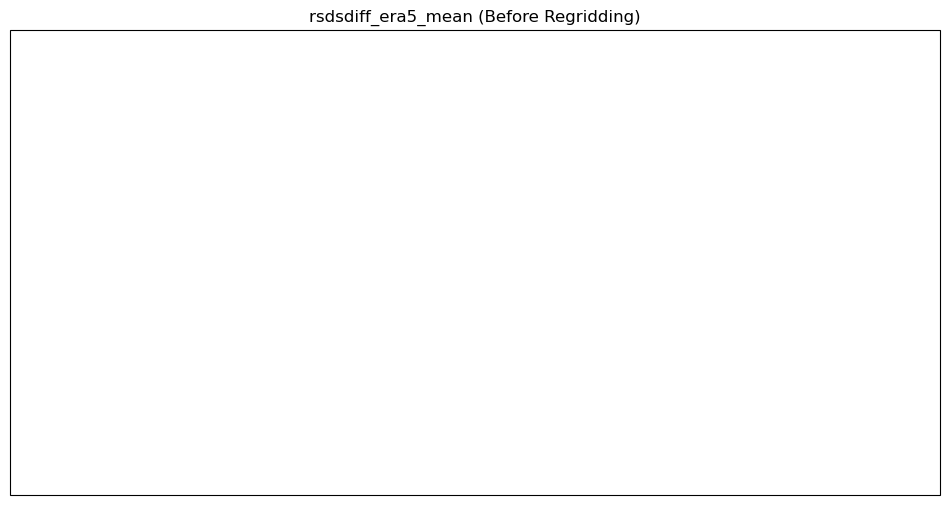

In [26]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Extract the longitude and latitude from the datasets
lon_era5 = rsdsdiff_era5_mean_cut.lon
lat_era5 = rsdsdiff_era5_mean_cut.lat
lon_era5_interp = rsdsdiff_era5_mean_interp_cut.lon
lat_era5_interp = rsdsdiff_era5_mean_interp_cut.lat

# Calculate the global min and max of solar diffuse irradiance (before and after regridding)
vmin = min(rsdsdiff_era5_mean.min(), rsdsdiff_era5_mean_interp_cut.min())
vmax = max(rsdsdiff_era5_mean.max(), rsdsdiff_era5_mean_interp_cut.max())

# Create the figure for rsds_era5_mean (before regridding)
fig1, ax1 = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax1.set_title('rsdsdiff_era5_mean (Before Regridding)')
rsdsdiff_era5_mean_cut.plot(
    ax=ax1,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for solar irradiance
    cbar_kwargs={'label': 'Solar diffuse irradiance (W/m^2)'},
    vmin=vmin, vmax=vmax  # Set consistent color scale
)

# Add map features for context
ax1.coastlines(resolution='10m', linewidth=1)
ax1.add_feature(cfeature.BORDERS, linestyle=':')
ax1.add_feature(cfeature.LAND, facecolor='lightgray')
ax1.add_feature(cfeature.OCEAN, facecolor='white')

# Add gridlines for exact latitude and longitude points (before regridding)
ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon_era5, ylocs=lat_era5, x_inline=False, y_inline=False)

# Set the extent to Europe for the first plot
ax1.set_extent([lon_era5.min(), lon_era5.max(), lat_era5.min(), lat_era5.max()])

# Show the first plot
plt.title(f'Average Solar Diffuse Irradiance over Europe, Era5 before regridding')
plt.tight_layout()
plt.show()

# Create the figure for rsds_era5_mean_interp (after regridding)
fig2, ax2 = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax2.set_title('rsdsdiff_era5_mean_interp (After Regridding)')
rsdsdiff_era5_mean_interp_cut.plot(
    ax=ax2,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for solar irradiance
    cbar_kwargs={'label': 'Solar diffuse irradiance (W/m^2)'},
    vmin=vmin, vmax=vmax  # Set consistent color scale
)

# Add map features for context
ax2.coastlines(resolution='10m', linewidth=1)
ax2.add_feature(cfeature.BORDERS, linestyle=':')
ax2.add_feature(cfeature.LAND, facecolor='lightgray')
ax2.add_feature(cfeature.OCEAN, facecolor='white')

# Add gridlines for exact latitude and longitude points (after regridding)
ax2.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon_era5_interp, ylocs=lat_era5_interp, x_inline=False, y_inline=False)

# Set the extent to Europe for the second plot
ax2.set_extent([lon_era5_interp.min(), lon_era5_interp.max(), lat_era5_interp.min(), lat_era5_interp.max()])

# Show the second plot
plt.title(f'Average Solar Diffuse Irradiance over Europe, Era5 after regridding')
plt.tight_layout()
plt.show()


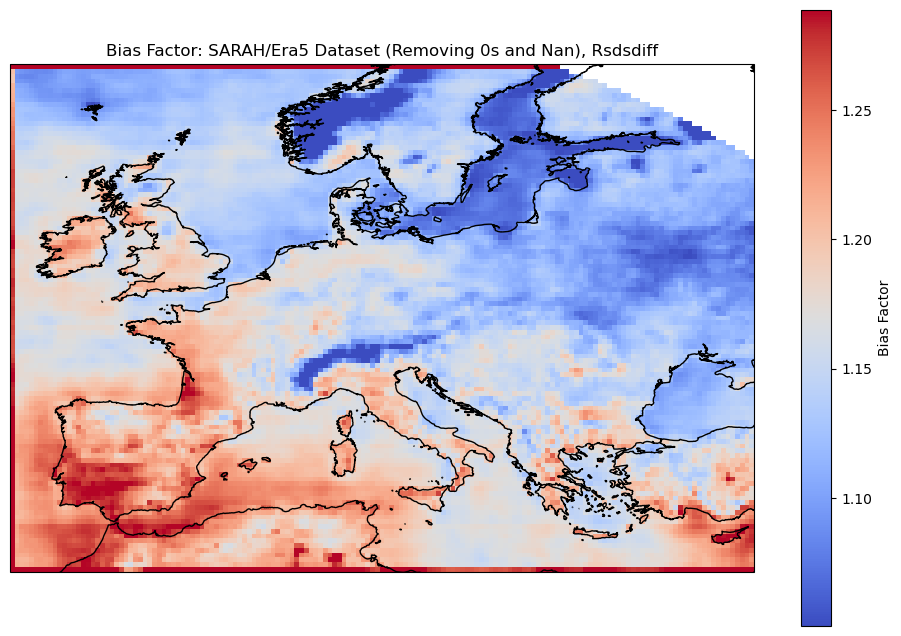

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Assuming these variables exist
denominator_rsdsdiff = rsdsdiff_era5_mean_interp_cut.values  # ERA5 dataset
numerator_rsdsdiff = rsdsdiff_sarah_mean_cut.values  # SARAH dataset

# Ensure valid bias factor calculation
mask_valid_rsdsdiff= (denominator_rsdsdiff != 0) & (numerator_rsdsdiff != 0)  # Avoid division by zero and all values in SARAH that have mean 0
biased_values_rsdsdiff = np.where(mask_valid_rsdsdiff, numerator_rsdsdiff / denominator_rsdsdiff, np.nan)  # Replace invalid cases with NaN

# Ensure correct shape (remove extra dimension if it exists)
biased_values_rsdsdiff = np.squeeze(biased_values_rsdsdiff)  # Remove extra dimensions (e.g., (2, 131, 177) to (131, 177))

# Check if the biased_values shape matches lon2d, lat2d
# Get lat/lon values
lon = rsdsdiff_sarah_mean_cut.lon.values
lat = rsdsdiff_sarah_mean_cut.lat.values

# Ensure lon/lat are 2D using meshgrid
lon2d, lat2d = np.meshgrid(lon, lat)

# Use percentiles to remove outliers
vmin = np.nanpercentile(biased_values_rsdsdiff, 2)  # 2nd percentile (lower bound)
vmax = np.nanpercentile(biased_values_rsdsdiff, 98)  # 98th percentile (upper bound)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the bias factor (masked)
c = ax.pcolormesh(
    lon2d, lat2d, biased_values_rsdsdiff,  # Ensure correct shapes
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for bias factor
    shading='auto',
    vmin=vmin, vmax=vmax  # Clip extreme outliers
)

# Add map features
ax.coastlines(resolution='10m', linewidth=1)
ax.set_title("Bias Factor: SARAH/Era5 Dataset (Removing 0s and Nan), Rsdsdiff")

# Add colorbar
cbar = fig.colorbar(c, ax=ax, orientation='vertical', label='Bias Factor')

plt.show()

In [ ]:
# Calculate the 2nd and 98th percentiles to exclude outliers
lower_percentile_rsdsdiff = np.nanpercentile(biased_values_rsdsdiff, 2)  # 2nd percentile
upper_percentile_rsdsdiff = np.nanpercentile(biased_values_rsdsdiff, 98)  # 98th percentile

# Print the percentiles to check their range
print(f"2nd Percentile: {lower_percentile_rsdsdiff}")
print(f"98th Percentile: {upper_percentile_rsdsdiff}")

# Mask the biased_values to keep only those within the 2nd and 98th percentiles
filtered_biased_values_rsdsdiff = biased_values_rsdsdiff[(biased_values_rsdsdiff >= lower_percentile_rsdsdiff) & (biased_values_rsdsdiff <= upper_percentile_rsdsdiff)]

# Calculate the mean of the filtered values
mean_bias_factor_era5_sarah_rsdsdiff = np.nanmean(filtered_biased_values_rsdsdiff)

print(f"Mean Bias Factor for Rsdsdiff(excluding outliers): {mean_bias_factor_era5_sarah_rsdsdiff:.3f}")

2nd Percentile: 1.050549030303955
98th Percentile: 1.2887215614318848
Mean Bias Factor for Rsdsdiff(excluding outliers): 1.160


In [ ]:
corrected_rsdsdiff_era5= rsdsdiff_era5_mean_interp_cut.values * biased_values_rsdsdiff
corrected_rsdsdiff_era5

array([[78.767075, 78.27526 , 77.63925 , ..., 72.42006 , 72.61052 ,
        72.56339 ],
       [78.84287 , 78.376114, 77.883865, ..., 72.486374, 72.83623 ,
        72.86116 ],
       [78.33671 , 77.89401 , 77.46157 , ..., 72.04475 , 72.23981 ,
        72.00439 ],
       ...,
       [50.62194 , 50.636845, 50.73465 , ...,       nan,       nan,
              nan],
       [50.36794 , 50.440193, 50.596775, ...,       nan,       nan,
              nan],
       [50.0496  , 50.197426, 50.336845, ...,       nan,       nan,
              nan]], dtype=float32)

In [ ]:

from scipy import interpolate

# Create a mask to identify the NaN values
nan_mask_rsdsdiff = np.isnan(corrected_rsdsdiff_era5)

# Perform interpolation to fill NaN values
# Use the 'nearest' method to fill NaNs with the closest available value

# Interpolation along each column (latitude)
corrected_rsdsdiff_era5_filled = np.copy(corrected_rsdsdiff_era5)

for i in range(corrected_rsdsdiff_era5.shape[1]):  # Iterate over each column (longitude)
    col = corrected_rsdsdiff_era5[:, i]
    # Interpolate the column for NaN values
    col_filled = interpolate.interp1d(
        np.where(~np.isnan(col))[0],  # Indices of non-NaN values
        col[~np.isnan(col)],  # Non-NaN values
        kind='nearest',  # Nearest-neighbor interpolation
        fill_value='extrapolate',  # Extrapolate if needed (you can set to 'NaN' instead)
        bounds_error=False  # Avoid errors if no non-NaN values are found
    )
    corrected_rsdsdiff_era5_filled[:, i] = col_filled(np.arange(corrected_rsdsdiff_era5.shape[0]))

# After filling NaNs, check again for NaNs
nan_count_filled_rsdsdiff = np.sum(np.isnan(corrected_rsdsdiff_era5_filled))

print(f"Number of NaN values after filling: {nan_count_filled_rsdsdiff}")

Number of NaN values after filling: 0


In [ ]:
corrected_rsdsdiff_era5_filled

array([[78.767075, 78.27526 , 77.63925 , ..., 72.42006 , 72.61052 ,
        72.56339 ],
       [78.84287 , 78.376114, 77.883865, ..., 72.486374, 72.83623 ,
        72.86116 ],
       [78.33671 , 77.89401 , 77.46157 , ..., 72.04475 , 72.23981 ,
        72.00439 ],
       ...,
       [50.62194 , 50.636845, 50.73465 , ..., 54.231125, 54.571808,
        54.49697 ],
       [50.36794 , 50.440193, 50.596775, ..., 54.231125, 54.571808,
        54.49697 ],
       [50.0496  , 50.197426, 50.336845, ..., 54.231125, 54.571808,
        54.49697 ]], dtype=float32)

In [ ]:
#Now we do the same for rsdsdiff
from regridding_functions import read_and_average_era5_marta
from regridding_functions import read_and_average_sarah
tas_era5_mean= read_and_average_era5_marta('temperature')
tas_sarah_mean= read_and_average_sarah('temperature')

['/groups/EXTREMES/cutouts/europe-1996-era5.nc', '/groups/EXTREMES/cutouts/europe-2010-era5.nc', '/groups/EXTREMES/cutouts/europe-2012-era5.nc', '/groups/EXTREMES/cutouts/europe-2013-era5.nc']
['/groups/EXTREMES/SARAH-3/europe-1996-sarah3-era5.nc', '/groups/EXTREMES/SARAH-3/europe-2010-sarah3-era5.nc', '/groups/EXTREMES/SARAH-3/europe-2012-sarah3-era5.nc', '/groups/EXTREMES/SARAH-3/europe-2013-sarah3-era5.nc']


In [ ]:
tas_era5_mean_cut=tas_era5_mean.sel(x=slice(-12, 35), y=slice(33, 72))
tas_sarah_mean_cut=tas_sarah_mean.sel(x=slice(-12, 35), y=slice(33, 72))

In [ ]:
from regridding_functions import regrid
regridder_tas=regrid(tas_era5_mean_cut, tas_sarah_mean_cut, method='conservative')

tas_era5_mean_interp_cut=regridder_tas(tas_era5_mean_cut)

189 190
157 158
157 158
131 132


/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('y', 'x') from data variable temperature as the horizontal dimensions for the regridding.
  warnings.warn(


NotImplementedError: 'item' is not yet a valid method on dask arrays

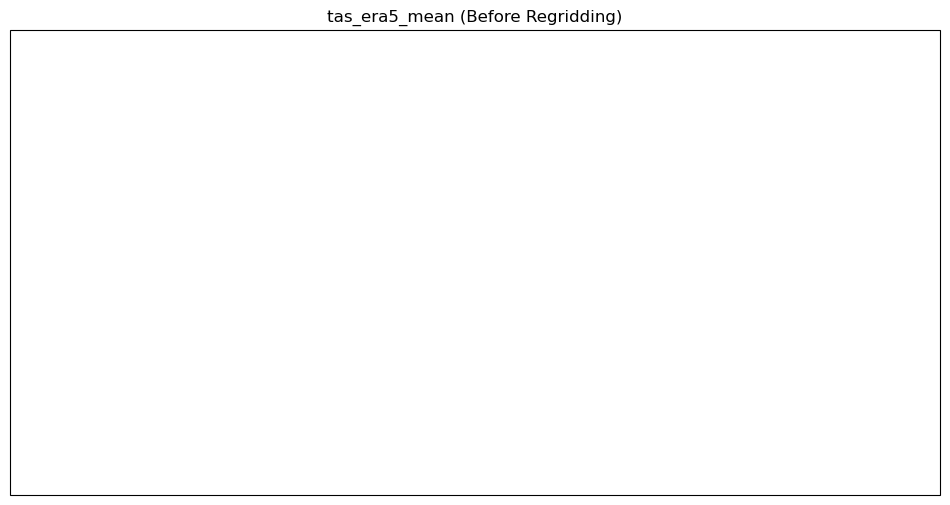

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from matplotlib.colors import TwoSlopeNorm

# Function to remove outliers using IQR
def remove_outliers(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return data.where((data >= lower_bound) & (data <= upper_bound))

# Mask zero values and remove outliers in the datasets
tas_era5_mean_cut = remove_outliers(tas_era5_mean_cut.where(tas_era5_mean_cut != 0))
tas_era5_mean_interp_cut = remove_outliers(tas_era5_mean_interp_cut.where(tas_era5_mean_interp_cut != 0))

# Extract the longitude and latitude from the datasets
lon_era5_tas = tas_era5_mean_cut.lon
lat_era5_tas = tas_era5_mean_cut.lat
lon_era5_interp_tas = tas_era5_mean_interp_cut.lon
lat_era5_interp_tas = tas_era5_mean_interp_cut.lat

# Calculate the global min and max of temperature (before and after regridding)
vmin_tas = min(tas_era5_mean_cut.min(), tas_era5_mean_interp_cut.min())
vmax_tas = max(tas_era5_mean_cut.max(), tas_era5_mean_interp_cut.max())
midpoint_tas = 0.5 * (vmin_tas + vmax_tas)

# Create the figure for tas_era5_mean (before regridding)
fig1, ax1 = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax1.set_title('tas_era5_mean (Before Regridding)')
tas_era5_mean_cut.plot(
    ax=ax1,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for temperature
    cbar_kwargs={'label': 'Temperature (K)'},
    norm=TwoSlopeNorm(vmin=vmin_tas, vcenter=midpoint_tas, vmax=vmax_tas)  # Set consistent color scale with midpoint
)

# Add map features for context
ax1.coastlines(resolution='10m', linewidth=1)
ax1.add_feature(cfeature.BORDERS, linestyle=':')
ax1.add_feature(cfeature.LAND, facecolor='lightgray')
ax1.add_feature(cfeature.OCEAN, facecolor='white')

# Add gridlines for exact latitude and longitude points (before regridding)
ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon_era5_tas, ylocs=lat_era5_tas, x_inline=False, y_inline=False)

# Set the extent to Europe for the first plot
ax1.set_extent([lon_era5_tas.min(), lon_era5_tas.max(), lat_era5_tas.min(), lat_era5_tas.max()])

# Show the first plot
plt.title(f'Average Temperature over Europe, Era5 before regridding')
plt.tight_layout()
plt.show()

# Create the figure for tas_era5_mean_interp (after regridding)
fig2, ax2 = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax2.set_title('tas_era5_mean_interp (After Regridding)')
tas_era5_mean_interp_cut.plot(
    ax=ax2,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for temperature
    cbar_kwargs={'label': 'Temperature (K)'},
    norm=TwoSlopeNorm(vmin=vmin_tas, vcenter=midpoint_tas, vmax=vmax_tas)  # Set consistent color scale with midpoint
)

# Add map features for context
ax2.coastlines(resolution='10m', linewidth=1)
ax2.add_feature(cfeature.BORDERS, linestyle=':')
ax2.add_feature(cfeature.LAND, facecolor='lightgray')
ax2.add_feature(cfeature.OCEAN, facecolor='white')

# Add gridlines for exact latitude and longitude points (after regridding)
ax2.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon_era5_interp_tas, ylocs=lat_era5_interp_tas, x_inline=False, y_inline=False)

# Set the extent to Europe for the second plot
ax2.set_extent([lon_era5_interp_tas.min(), lon_era5_interp_tas.max(), lat_era5_interp_tas.min(), lat_era5_interp_tas.max()])

# Show the second plot
plt.title(f'Average Temperature over Europe, Era5 after regridding')
plt.tight_layout()
plt.show()

In [ ]:
denominator_tas = tas_era5_mean_interp_cut.values  # ERA5 dataset
numerator_tas = tas_sarah_mean_cut.values 


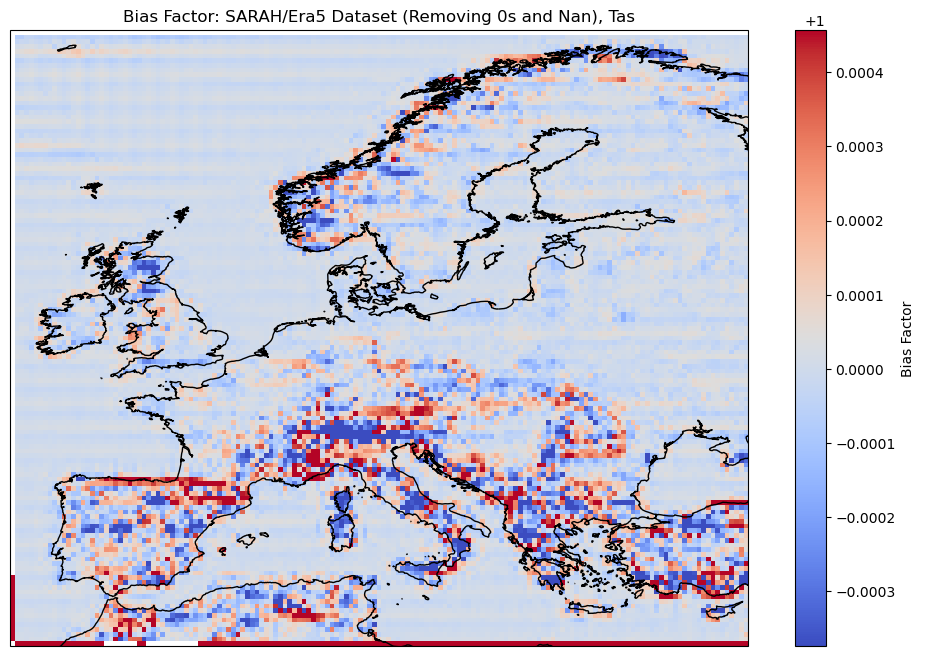

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Assuming these variables exist
denominator_tas = tas_era5_mean_interp_cut.values  # ERA5 dataset
numerator_tas = tas_sarah_mean_cut.values  # SARAH dataset

# Ensure valid bias factor calculation
mask_valid_tas = (denominator_tas != 0) & (numerator_tas != 0)  # Avoid division by zero and all values in SARAH that have mean 0
biased_values_tas = np.where(mask_valid_tas, numerator_tas / denominator_tas, np.nan)  # Replace invalid cases with NaN

# Ensure correct shape (remove extra dimension if it exists)
biased_values_tas = np.squeeze(biased_values_tas)  # Remove extra dimensions (e.g., (2, 131, 177) to (131, 177))

# Check if the biased_values shape matches lon2d_tas, lat2d_tas
# Get lat/lon values
lon_tas = tas_sarah_mean_cut.lon.values
lat_tas = tas_sarah_mean_cut.lat.values

# Ensure lon/lat are 2D using meshgrid
lon2d_tas, lat2d_tas = np.meshgrid(lon_tas, lat_tas)

# Use percentiles to remove outliers
vmin_tas = np.nanpercentile(biased_values_tas, 2)  # 2nd percentile (lower bound)
vmax_tas = np.nanpercentile(biased_values_tas, 98)  # 98th percentile (upper bound)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the bias factor (masked)
c = ax.pcolormesh(
    lon2d_tas, lat2d_tas, biased_values_tas,  # Ensure correct shapes
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for bias factor
    shading='auto',
    vmin=vmin_tas, vmax=vmax_tas  # Clip extreme outliers
)

# Add map features
ax.coastlines(resolution='10m', linewidth=1)
ax.set_title("Bias Factor: SARAH/Era5 Dataset (Removing 0s and Nan), Tas")

# Add colorbar
cbar = fig.colorbar(c, ax=ax, orientation='vertical', label='Bias Factor')

plt.show()

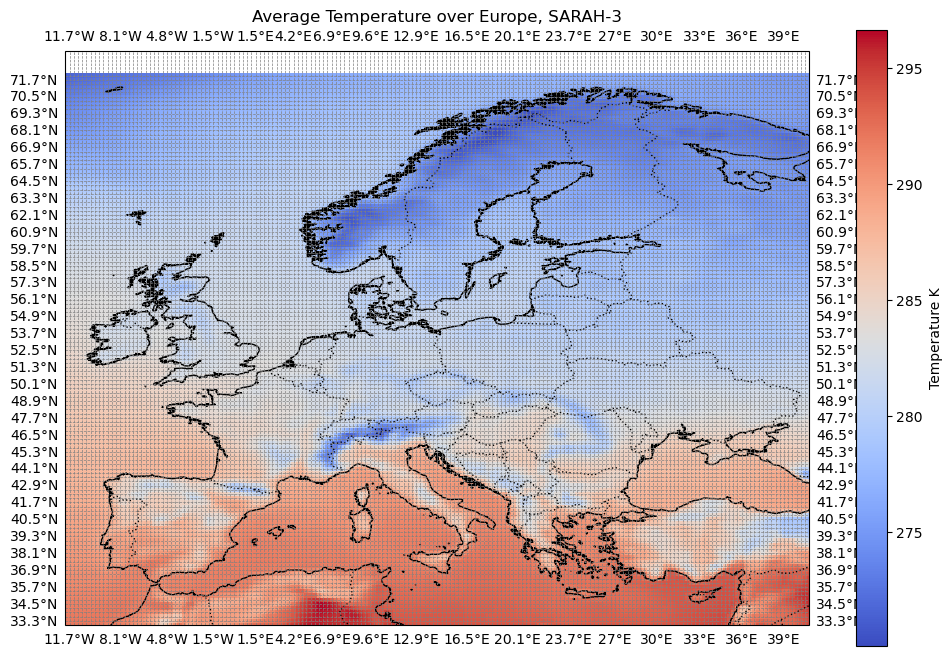

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Extract the longitude and latitude from the dataset
lon_tas_sarah = tas_sarah_mean.lon
lat_tas_sarah = tas_sarah_mean.lat

# Create the figure and axes with a PlateCarree projection
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the solar irradiance at the selected time
tas_sarah_mean.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='coolwarm',  # Colormap for solar irradiance
    cbar_kwargs={'label': 'Temperature K'}
)

# Add map features for context
ax.coastlines(resolution='10m', linewidth=1)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='white')

# Set extent to Europe using the min and max of the lon and lat from the data
ax.set_extent([lon_tas_sarah.min(), lon_tas_sarah.max(), lat_tas_sarah.min(), lat_tas_sarah.max()])

# Add gridlines for each latitude and longitude
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--', xlocs=lon, ylocs=lat, x_inline=False, y_inline=False)

# Add title and labels
plt.title(f'Average Temperature over Europe, SARAH-3')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

In [ ]:
# Calculate the 2nd and 98th percentiles to exclude outliers
lower_percentile_tas = np.nanpercentile(biased_values_tas, 2)  # 2nd percentile
upper_percentile_tas = np.nanpercentile(biased_values_tas, 98)  # 98th percentile

# Print the percentiles to check their range
print(f"2nd Percentile: {lower_percentile_tas}")
print(f"98th Percentile: {upper_percentile_tas}")

# Mask the biased_values_tas to keep only those within the 2nd and 98th percentiles
filtered_biased_values_tas = biased_values_tas[(biased_values_tas >= lower_percentile_tas) & (biased_values_tas <= upper_percentile_tas)]

# Calculate the mean of the filtered values
mean_bias_factor_era5_sarah_tas = np.nanmean(filtered_biased_values_tas)

print(f"Mean Bias Factor (excluding outliers): {mean_bias_factor_era5_sarah_tas:.3f}")

2nd Percentile: 0.9996262417214671
98th Percentile: 1.000456915207001
Mean Bias Factor (excluding outliers): 1.000


In [ ]:
corrected_tas_era5= tas_era5_mean_interp.values * biased_values_tas
corrected_tas_era5

array([[         nan, 292.04835544, 292.06729153, ..., 293.53769988,
        293.91362179,          nan],
       [291.95240652, 291.96274544, 291.97191183, ..., 293.5658677 ,
        293.88217767,          nan],
       [291.84642755, 291.86206355, 291.87364713, ..., 293.74132111,
        293.979466  ,          nan],
       ...,
       [         nan, 272.26380489, 272.35078845, ..., 275.22415053,
        275.19056202,          nan],
       [         nan, 271.90116899, 272.00151892, ..., 275.0583535 ,
        275.05978716,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan]])

In [ ]:
from scipy import interpolate
import numpy as np

# Create a mask to identify the NaN values
nan_mask_tas = np.isnan(corrected_tas_era5)

# Perform interpolation to fill NaN values
# Use the 'nearest' method to fill NaNs with the closest available value

# Interpolation along each column (latitude)
corrected_tas_era5_filled = np.copy(corrected_tas_era5)

for i in range(corrected_tas_era5.shape[1]):  # Iterate over each column (longitude)
    col = corrected_tas_era5[:, i]
    # Check if the column contains only NaN values
    if np.all(np.isnan(col)):
        continue  # Skip this column if it contains only NaN values
    # Interpolate the column for NaN values
    col_filled = interpolate.interp1d(
        np.where(~np.isnan(col))[0],  # Indices of non-NaN values
        col[~np.isnan(col)],  # Non-NaN values
        kind='nearest',  # Nearest-neighbor interpolation
        fill_value='extrapolate',  # Extrapolate if needed (you can set to 'NaN' instead)
        bounds_error=False  # Avoid errors if no non-NaN values are found
    )
    corrected_tas_era5_filled[:, i] = col_filled(np.arange(corrected_tas_era5.shape[0]))

# Interpolation along each row (longitude) for remaining NaNs
for i in range(corrected_tas_era5_filled.shape[0]):  # Iterate over each row (latitude)
    row = corrected_tas_era5_filled[i, :]
    # Check if the row contains only NaN values
    if np.all(np.isnan(row)):
        continue  # Skip this row if it contains only NaN values
    # Interpolate the row for NaN values
    row_filled = interpolate.interp1d(
        np.where(~np.isnan(row))[0],  # Indices of non-NaN values
        row[~np.isnan(row)],  # Non-NaN values
        kind='nearest',  # Nearest-neighbor interpolation
        fill_value='extrapolate',  # Extrapolate if needed (you can set to 'NaN' instead)
        bounds_error=False  # Avoid errors if no non-NaN values are found
    )
    corrected_tas_era5_filled[i, :] = row_filled(np.arange(corrected_tas_era5_filled.shape[1]))

# After filling NaNs, check again for NaNs
nan_count_filled = np.sum(np.isnan(corrected_tas_era5_filled))

print(f"Number of NaN values after filling: {nan_count_filled}")



Number of NaN values after filling: 0


In [ ]:
corrected_tas_era5_filled

array([[291.95240652, 292.04835544, 292.06729153, ..., 293.53769988,
        293.91362179, 293.91362179],
       [291.95240652, 291.96274544, 291.97191183, ..., 293.5658677 ,
        293.88217767, 293.88217767],
       [291.84642755, 291.86206355, 291.87364713, ..., 293.74132111,
        293.979466  , 293.979466  ],
       ...,
       [291.31033692, 272.26380489, 272.35078845, ..., 275.22415053,
        275.19056202, 275.19056202],
       [291.31033692, 271.90116899, 272.00151892, ..., 275.0583535 ,
        275.05978716, 275.05978716],
       [291.31033692, 271.90116899, 272.00151892, ..., 275.0583535 ,
        275.05978716, 275.05978716]])